# Antes de iniciar
Vamos a asegurarnos de tener acceso a la GPU de google Colaboratoy

In [1]:
!nvidia-smi

Tue Aug 15 23:26:22 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Validamos la ubicacion donde realizaremos nuestro entrenamiento

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


# Instalamos Ultralytics para utilizar YOLO desde PIP

YOLO es una red neuronal desarrollada por la empresa Utralytics, que predice los cuadros delimitadores y las probabilidades de clase a partir de una imagen en una sola evaluación. Los modelos de YOLO pueden procesar más de 60 fotogramas por segundo, por lo que es una arquitectura excelente para detectar objetos en vídeos. Puede encontrar más información sobre cómo funciona YOLO [aquí](https://arxiv.org/pdf/1506.02640v5.pdf).

In [3]:
!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.3/78.2 GB disk)


Importamos YOLO y una libreria adicional de IPython para visualizar imagenes en pantalla

In [4]:
from ultralytics import YOLO

from IPython.display import display, Image

Para garantizar que todo este en orden hacemos inferencia con el modelo COCO preentrenado

In [5]:
%cd {HOME}
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='https://estaticos-cdn.prensaiberica.es/clip/66e86d63-f5d3-4752-b019-29e28f5079a5_16-9-discover-aspect-ratio_default_0.jpg' save=True

/content
100% 6.23M/6.23M [00:00<00:00, 6.61MB/s]

2023-08-15 23:26:44.966847: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-15 23:26:45.938562: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs
100% 152k/152k [00:00<00:00, 198kB/s]
image 1/1 /content/66e86d63-f5d3-4752-b019-29e28f5079a5_16-9-discover-aspect-ratio_default_0.jpg: 384x640 9 dogs, 1 bear, 1 teddy bear, 59.9ms
Speed: 0.6ms pre-process, 59.9ms inference, 332.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict


Finalmente visualizamos la prediccion con el modelo preentrenado

/content


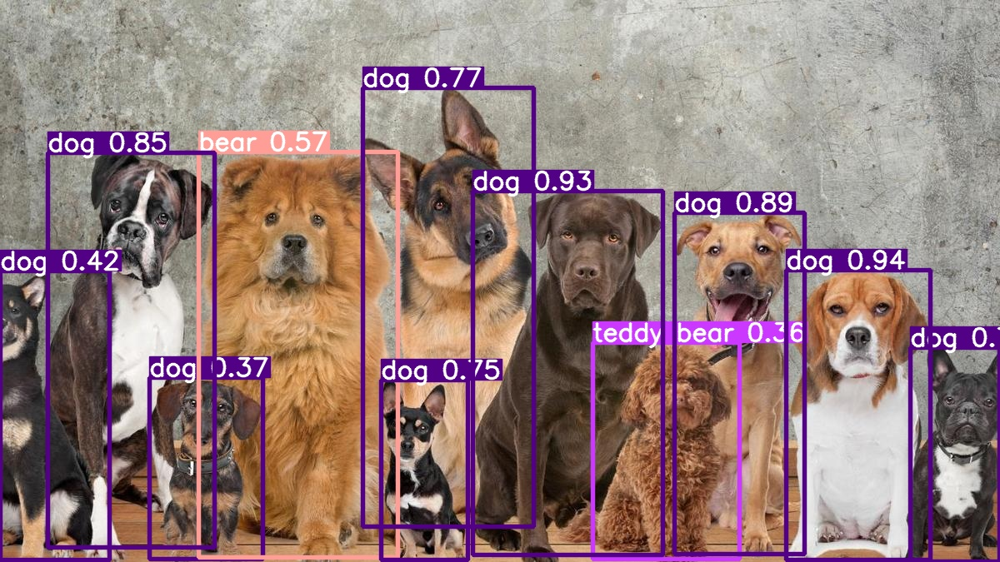

In [6]:
%cd {HOME}
Image('/content/runs/detect/predict/66e86d63-f5d3-4752-b019-29e28f5079a5_16-9-discover-aspect-ratio_default_0.jpg', height=600)

Ahora tenemos claro que el modelo esta importado y funciona correctamente.
El siguiente paso es realizar un entrenamiento personalizado con imagenes de codigos QR previamente etiquetados con sus bounding boxes correspondientes.

# DataSet

El dataset que utilizaremos para entrenar el modelo de Deep Learning YOLO v8 se encuentra en el siguiente enlace: https://universe.roboflow.com/comvis-mania-pwpbk/qr-code-detection-jaq6k/dataset/7

Este dataset previamente procesado por el equipo de [RoboFlow](https://universe.roboflow.com/) tiene la siguiente distribucion:
- Train: 630 imagenes
- Validation: 60 imagenes
- Test: 30 Imagenes

In [7]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="DrxC2P2IABvkNzFcj1t1")
project = rf.workspace("matej-cernohous").project("xcerno30-qr-codes")
dataset = project.version(21).download("yolov8")


/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.3/59.3 kB 7.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.1 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.134 is required but found version=8.0.20, to fix: `pip install ultralytics==8.0.134`


Extracting Dataset Version Zip to xcerno30-QR-codes-21 in yolov8:: 100%|██████████| 6100/6100 [00:02<00:00, 2761.28it/s]


# Realizamos el entrenamiento con el dataset que hemos descargado

In [8]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=50 imgsz=800 plots=True

/content
100% 21.5M/21.5M [00:02<00:00, 8.71MB/s]

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/content/datasets/xcerno30-QR-codes-21/data.yaml, epochs=50, patience=50, batch=16, imgsz=800, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, k

Cuando realizamos el entrenamiento se crea una nueva carpeta llamada Train, la cual contiene metricas de desempeño, vamos a ver que metricas se calculan automaticamente

In [9]:
!ls {HOME}/runs/detect/train/

args.yaml					    train_batch2.jpg
confusion_matrix.png				    train_batch5360.jpg
events.out.tfevents.1692142085.2c187146949c.1575.0  train_batch5361.jpg
F1_curve.png					    train_batch5362.jpg
P_curve.png					    val_batch0_labels.jpg
PR_curve.png					    val_batch0_pred.jpg
R_curve.png					    val_batch1_labels.jpg
results.csv					    val_batch1_pred.jpg
results.png					    val_batch2_labels.jpg
train_batch0.jpg				    val_batch2_pred.jpg
train_batch1.jpg				    weights


Visualizamos la Matriz de confusion para comprender como se comporta el modelo

/content


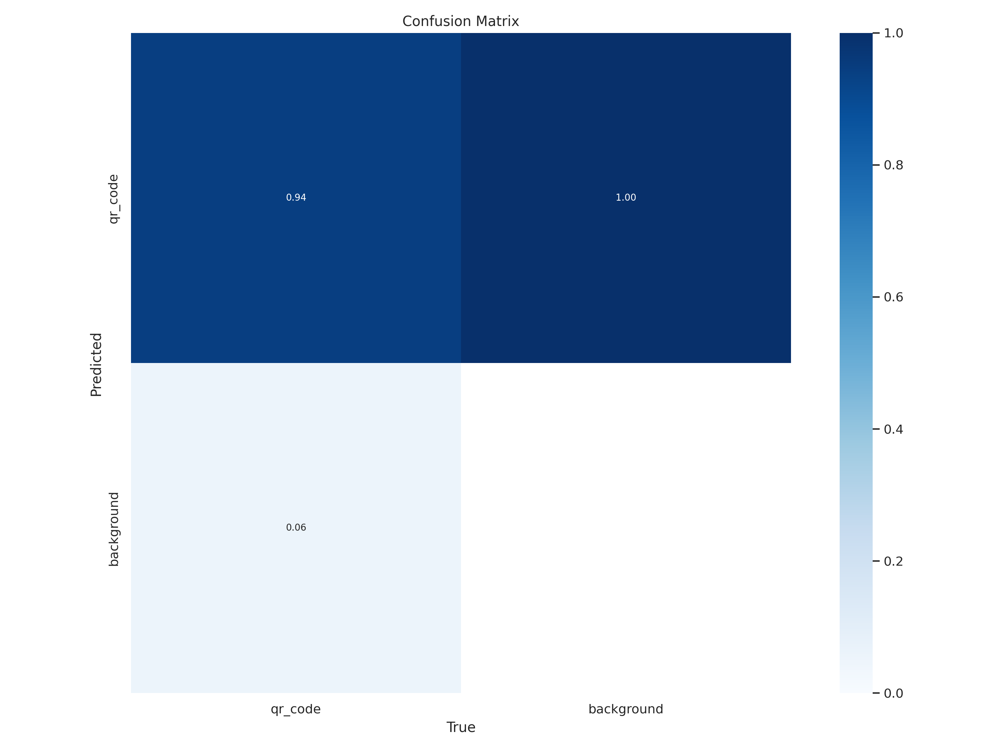

In [10]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

Vamos a validar si el modelo se entreno correctamente de manera grafica

/content


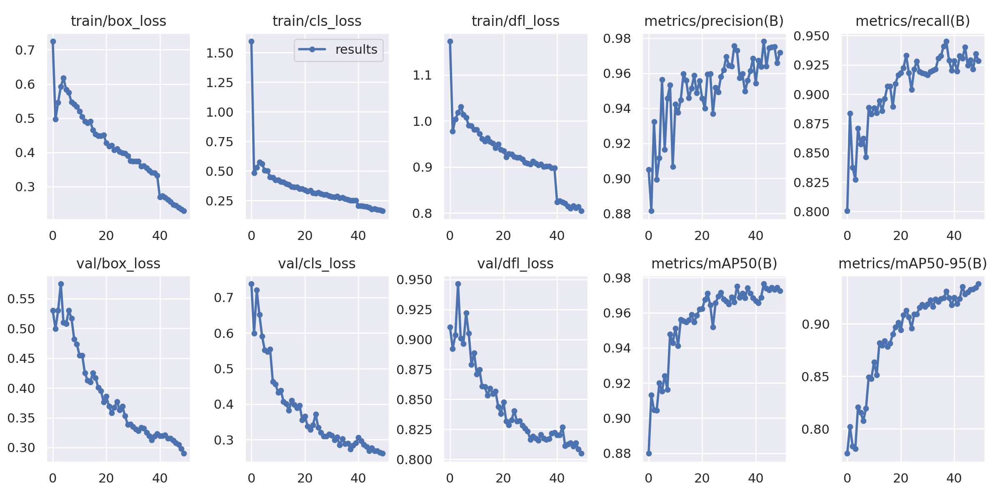

In [11]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

Visualizamos como se comporta el modelo con imagenes de codigos QR

/content


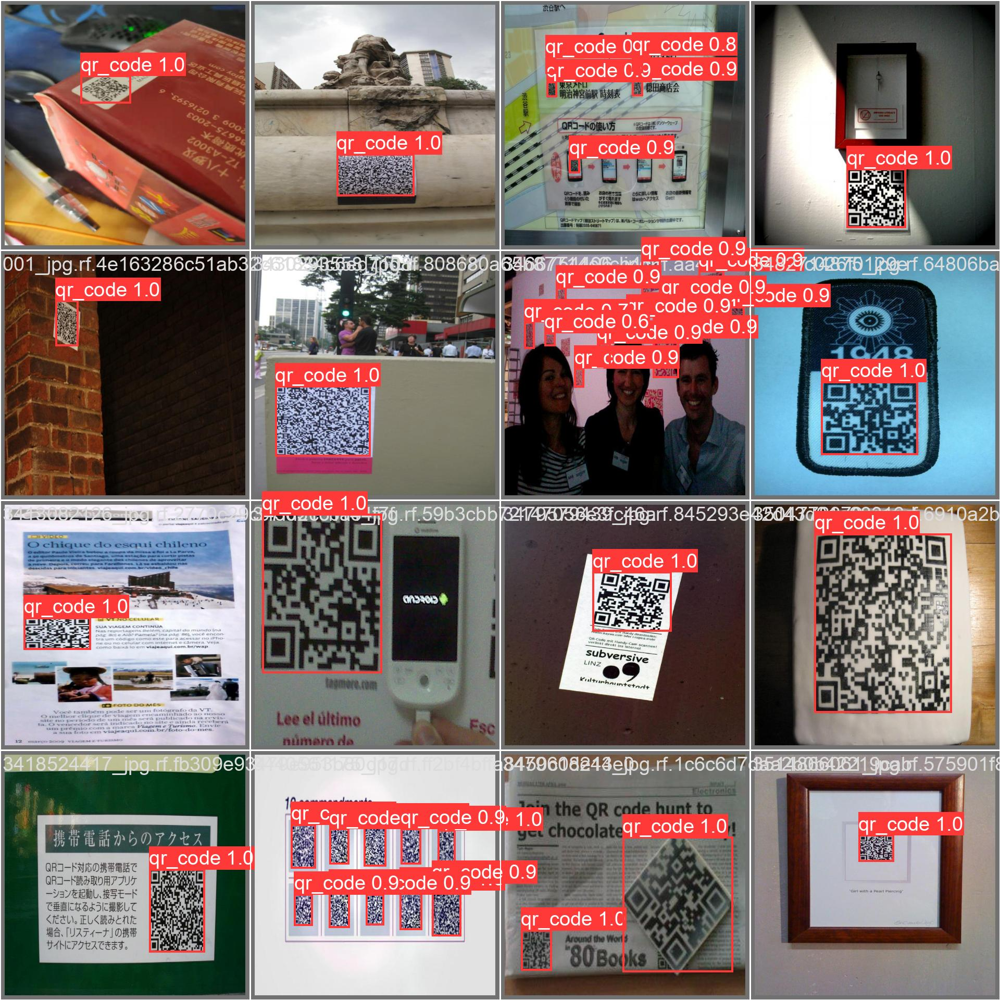

In [12]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

# Validamos el modelo

In [20]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
2023-08-16 01:10:07.074098: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-16 01:10:07.995741: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/xcerno30-QR-codes-21/valid/labels.cache... 607 images, 0 backgrounds, 0 corrupt: 100% 607/607 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 38/38 [00:15<00:00,  2.47it/s]
                   all        607        967      0.972      0.929      0.973       0.94
Speed: 1.5ms pre-process, 13.

# Finalmente realizamos inferencia sobre el set de test

In [21]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
2023-08-16 01:10:33.684486: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-16 01:10:34.967137: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs
image 1/305 /content/datasets/xcerno30-QR-codes-21/test/images/001_jpg.rf.9bd5f235fcaf84fa6b03846fc4648c41.jpg: 800x800 1 qr_code, 24.6ms
image 2/305 /content/datasets/xcerno30-QR-codes-21/test/images/003_jpg.rf.ddd05fe95f65f5a2b4c86dd490fe0e38.jpg: 800x800 1 qr_code, 24.6ms
image 3/305 /content/datasets/xcerno30-QR-codes-21/test/images/0200_jpg.rf.6465c7f0f7ffa80a98b89b039149b4b1.jpg

Se muestran algunas imagenes resultado de la deteccion

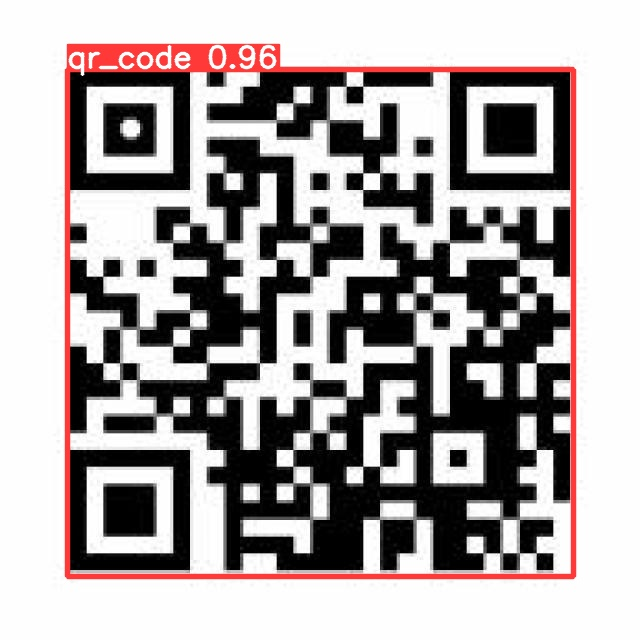

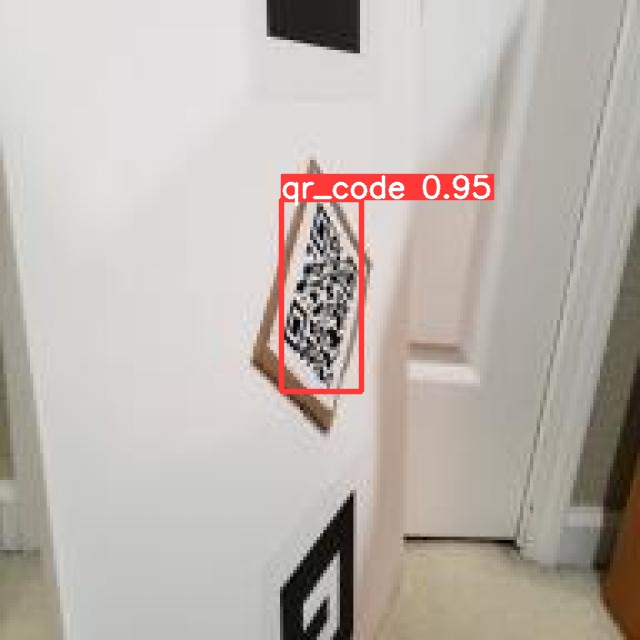

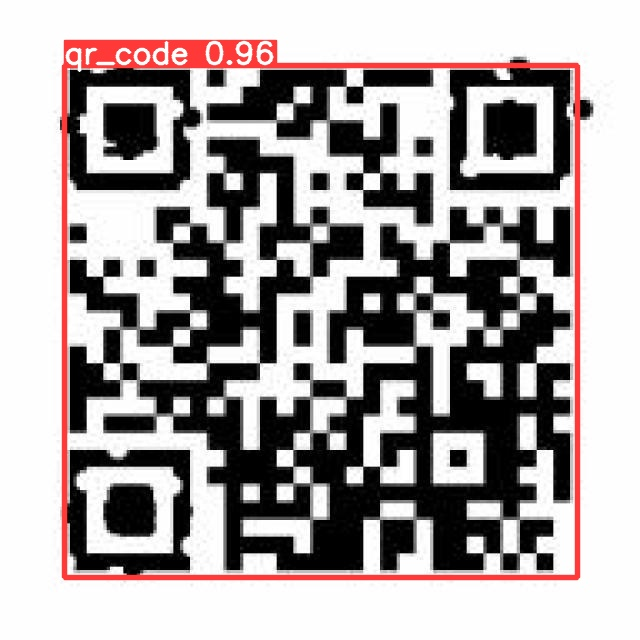

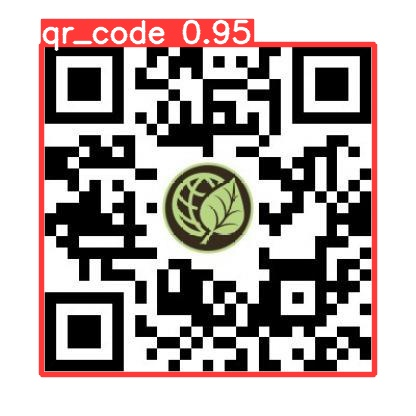

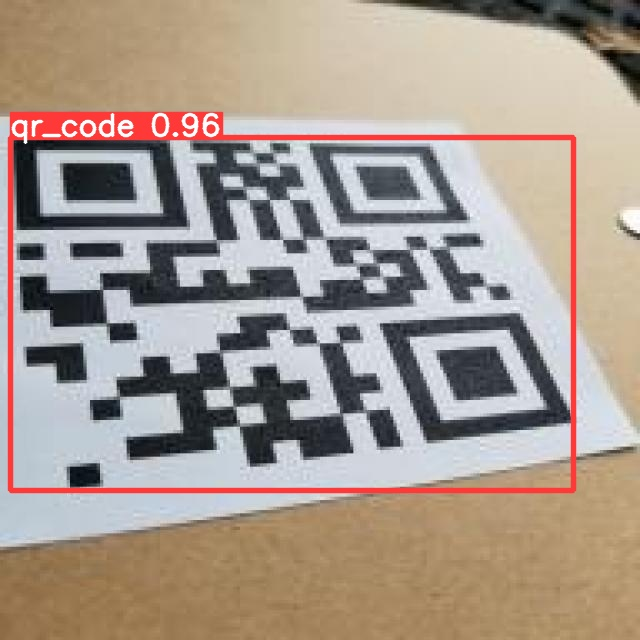

...

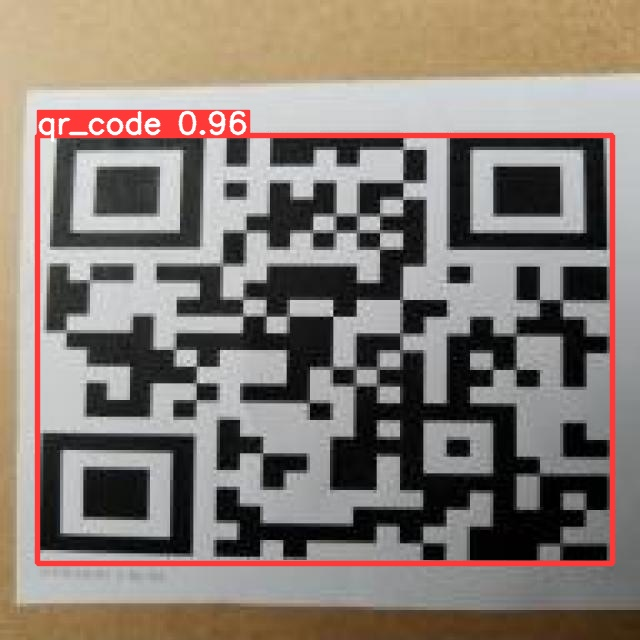

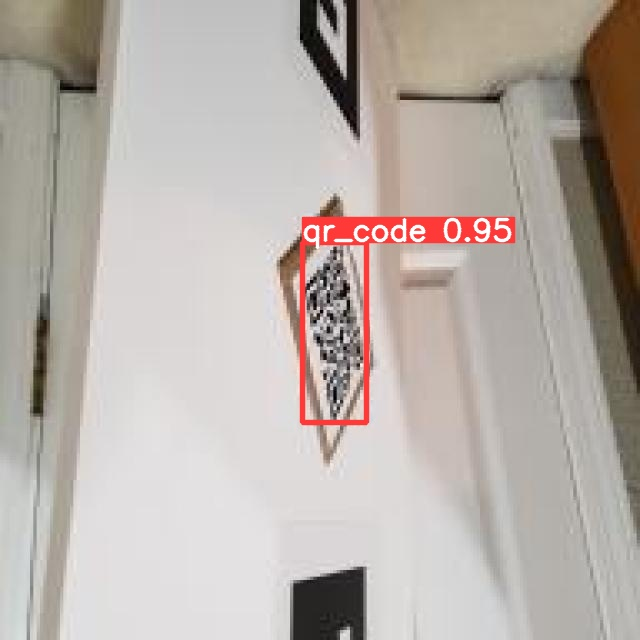

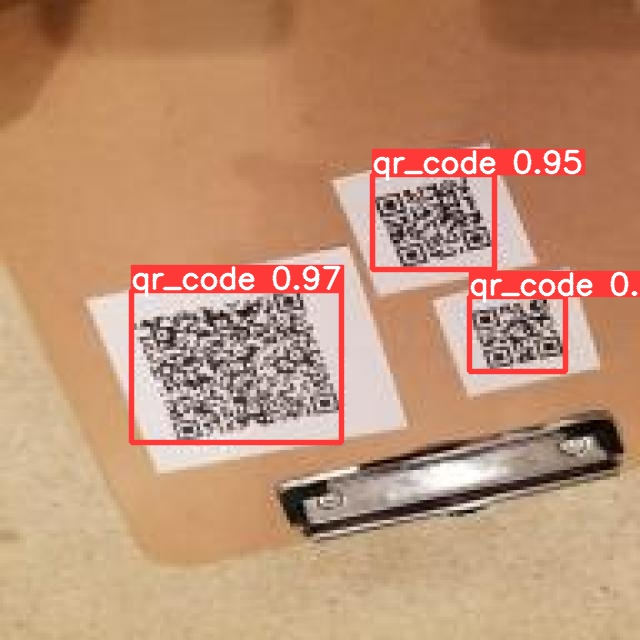

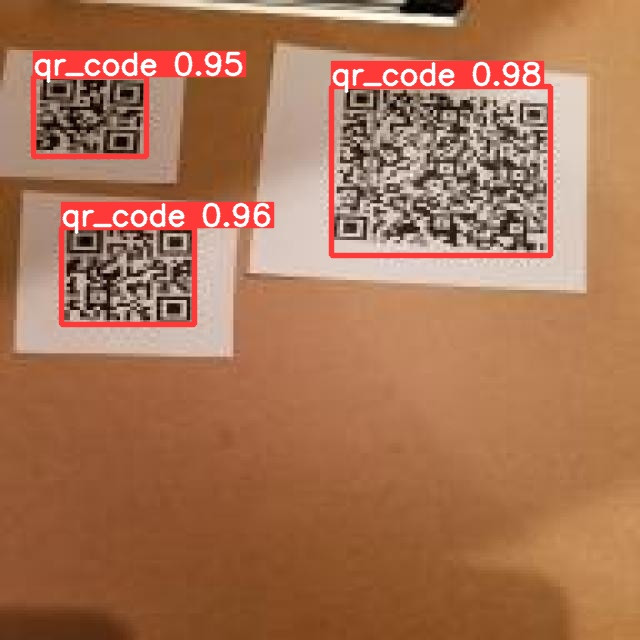

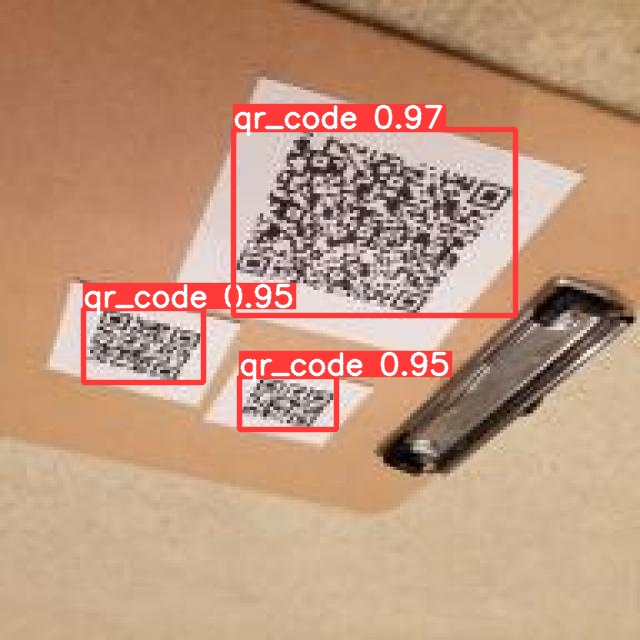

In [23]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict3/*.jpg')[:100]:
      display(Image(filename=image_path, width=600))
      print("\n")